In [1]:
import numpy as np
import xarray as xr

import stackstac
import planetary_computer
import pystac_client
from shapely.geometry import box

import matplotlib.pyplot as plt

import xrspatial.multispectral as ms
from xrspatial.convolution import calc_cellsize, circle_kernel, convolution_2d
from xrspatial.focal import mean, focal_stats, hotspots

from dask.distributed import Client, progress

In [2]:
client = Client()
print(f"/proxy/{client.scheduler_info()['services']['dashboard']}/status")

/proxy/8787/status


In [3]:
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

ids = [
    'LC08_L2SP_191027_20170706_02_T1',
    'LC08_L2SP_191027_20180927_02_T1',
    'LC08_L2SP_192027_20190921_02_T1',
    'LC08_L2SP_191027_20200612_02_T1',
    'LC08_L2SP_191027_20210615_02_T1'
]

aoi = [13.324065832846372,47.790832246642026, 13.457618384115904,47.867354172891204]

# search = catalog.search(collections=["landsat-8-c2-l2"], bbox=aoi, datetime='2021-05-01/2021-10-01', query={"eo:cloud_cover": {"lte": 30}})
search = catalog.search(collections=["landsat-8-c2-l2"], bbox=aoi, ids=ids)
items = search.item_collection()

items

In [4]:
data = (
    stackstac.stack(
        items,
        epsg=4326,
        bounds_latlon=aoi,
        resolution=0.000089494585235856472,
        assets=["SR_B2", "SR_B3", "SR_B4", "SR_B5", "SR_B6", "ST_B10"],
        chunksize=256,  # set chunk size to 256 to get one chunk per time step
    )
    .where(lambda x: x > 0, other=np.nan)  # sentinel-2 uses 0 as nodata
    .assign_coords(
        band=lambda x: x.common_name.rename("band"),  # use common names
        time=lambda x: x.time.dt.round(
            "D"
        ),  # round time to daily for nicer plot labels
    )
)
data

/opt/anaconda3/envs/planet/lib/python3.12/site-packages/stackstac/prepare.py:408: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  times = pd.to_datetime(


<xarray.DataArray 'stackstac-365a6c63cf7b911edf229edbfec695a2' (time: 5,
                                                                band: 6,
                                                                y: 856, x: 1493)> Size: 307MB
dask.array<where, shape=(5, 6, 856, 1493), dtype=float64, chunksize=(1, 1, 256, 256), chunktype=numpy.ndarray>
Coordinates: (12/27)
    id                           (time) <U31 620B 'LC08_L2SP_191027_20170706_...
  * x                            (x) float64 12kB 13.32 13.32 ... 13.46 13.46
  * y                            (y) float64 7kB 47.87 47.87 ... 47.79 47.79
    view:sun_azimuth             (time) float64 40B 141.6 159.6 ... 143.1 142.8
    landsat:scene_id             (time) <U21 420B 'LC81910272017187LGN00' ......
    view:sun_elevation           (time) float64 40B 60.84 38.98 41.23 61.8 61.88
    ...                           ...
    common_name                  (band) <U6 144B 'blue' 'green' ... 'lwir11'
    center_wavelength            (band) float64 48B 0.48 0.56 0.65 0.86 1.6 10.9
    full_width_half_max          (band) float64 48B 0.06 0.06 0.04 0.03 0.08 0.8
    epsg                         int64 8B 4326
  * band                         (band) <U6 144B 'blue' 'green' ... 'lwir11'
  * time                         (time) datetime64[ns] 40B 2017-07-06 ... 202...
Attributes:
    spec:        RasterSpec(epsg=4326, bounds=(13.324043344499549, 47.7908244...
    crs:         epsg:4326
    transform:   | 0.00, 0.00, 13.32|\n| 0.00,-0.00, 47.87|\n| 0.00, 0.00, 1.00|
    resolution:  8.949458523585647e-05

In [5]:
data = data.persist()
progress(data)

VBox()

In [6]:
rc = {
    "axes.spines.left": False,
    "axes.spines.right": False,
    "axes.spines.bottom": False,
    "axes.spines.top": False,
    "xtick.bottom": False,
    "xtick.labelbottom": False,
    "ytick.labelleft": False,
    "ytick.left": False,
}

plt.rcParams.update(rc)

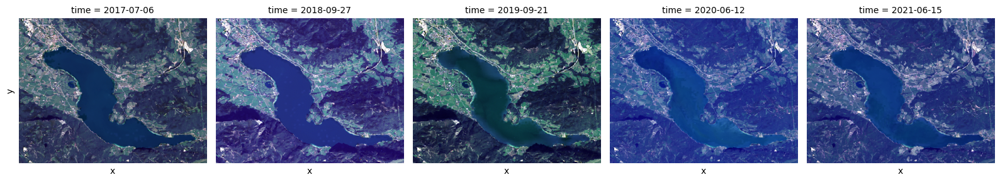

In [7]:
true_color_aggs = [
    ms.true_color(x.sel(band="red"), x.sel(band="green"), x.sel(band="blue"))
    for x in data
]

true_color = xr.concat(true_color_aggs, dim=data.coords["time"])
# visualize
t = true_color.plot.imshow(x="x", y="y", col="time", col_wrap=5)

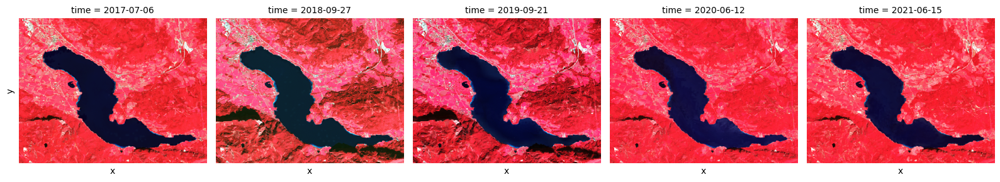

In [8]:
false_color_aggs = [
    ms.true_color(x.sel(band="nir08"), x.sel(band="red"), x.sel(band="green"))
    for x in data
]

false_color = xr.concat(false_color_aggs, dim=data.coords["time"])
# visualize
t = false_color.plot.imshow(x="x", y="y", col="time", col_wrap=5)

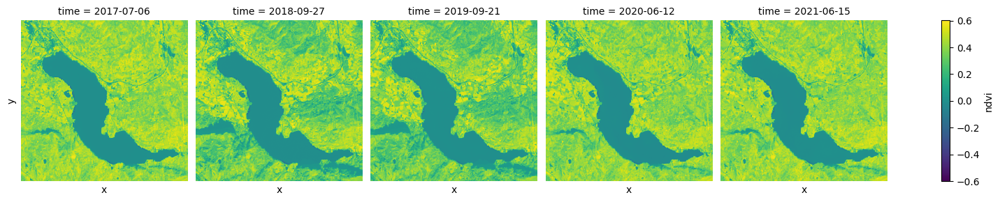

In [9]:
ndvi_aggs = [ms.ndvi(x.sel(band="nir08"), x.sel(band="red")) for x in data]

ndvi = xr.concat(ndvi_aggs, dim="time")

ndvi.plot.imshow(x="x", y="y", col="time", col_wrap=5, cmap="viridis");

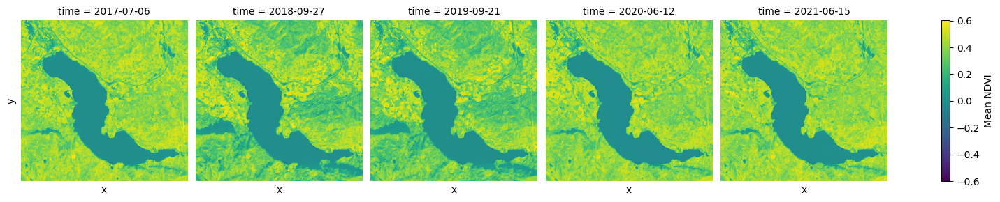

In [10]:
mean_aggs = [mean(ndvi_agg) for ndvi_agg in ndvi_aggs]

smooth = xr.concat(mean_aggs, dim="time")

s = smooth.plot.imshow(x="x", y="y", col="time", col_wrap=5, cmap="viridis",cbar_kwargs={"label": "Mean NDVI"})

In [11]:
cellsize = calc_cellsize(ndvi)
cellsize

(8.949458523585566e-05, 8.949458523585397e-05)

In [12]:
kernel = circle_kernel(*cellsize, radius=1.5 * cellsize[0])
kernel.shape

(3, 3)

In [13]:
kernel

array([[0., 1., 0.],
       [1., 1., 1.],
       [0., 1., 0.]])

In [14]:
%%time
stats_aggs = [focal_stats(ndvi_agg, kernel) for ndvi_agg in ndvi_aggs]

stats = xr.concat(stats_aggs, dim="time")

CPU times: user 139 ms, sys: 3.03 ms, total: 142 ms
Wall time: 142 ms


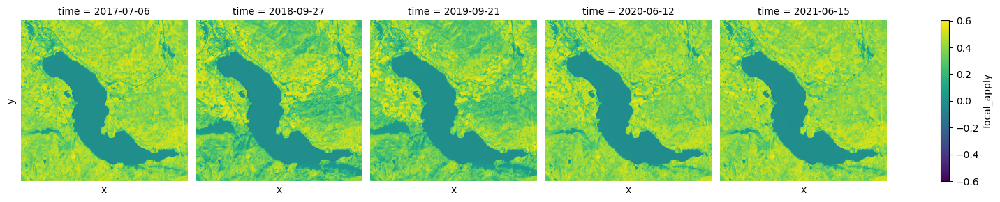

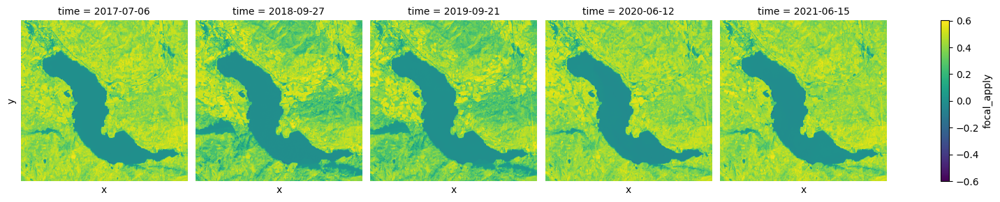

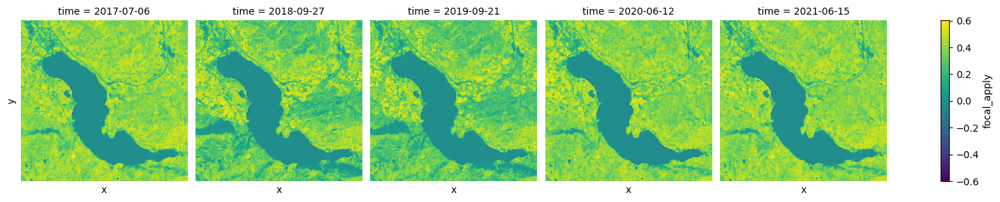

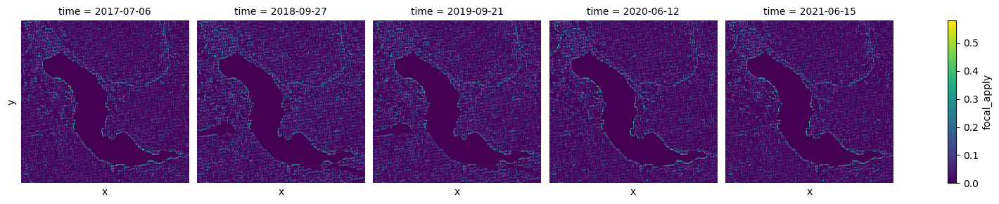

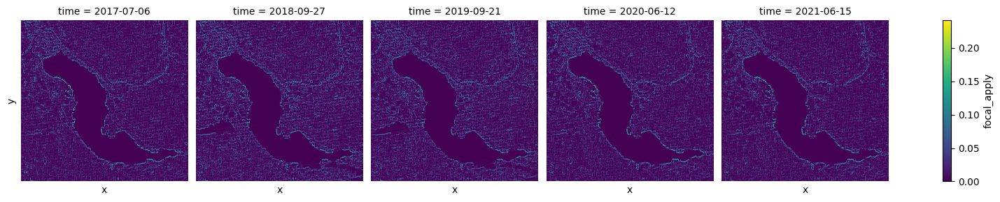

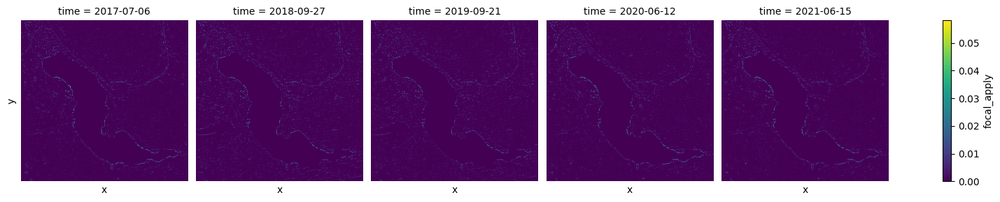

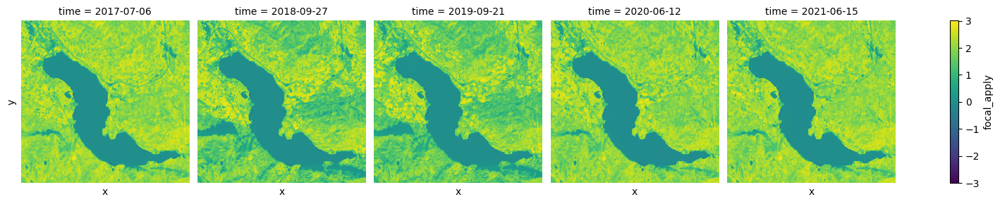

In [15]:
# transpose the data array so `stats` dimension appears first
stats_t = stats.transpose("stats", "time", "y", "x")

for stats_img in stats_t:
    g = stats_img.plot.imshow(x="x", y="y", col="time", col_wrap=5, cmap="viridis")

In [16]:
# Use Sobel operator
sobel_kernel = np.array([[1, 0, -1], [2, 0, -2], [1, 0, -1]])

sobel_kernel

array([[ 1,  0, -1],
       [ 2,  0, -2],
       [ 1,  0, -1]])

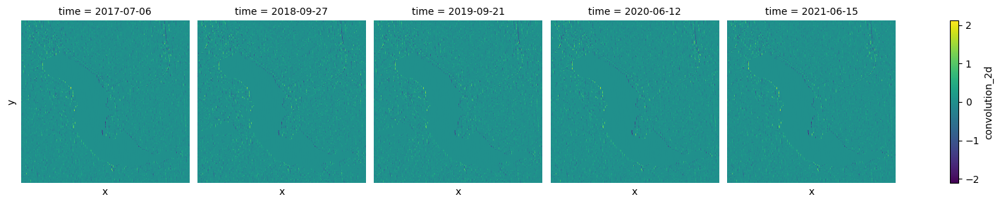

In [17]:
sobel_aggs = [convolution_2d(ndvi_agg, sobel_kernel) for ndvi_agg in ndvi_aggs]

sobel_agg = xr.concat(sobel_aggs, dim="time")

sobel_agg.plot.imshow(x="x", y="y", col="time", col_wrap=5, cmap="viridis");

In [18]:
%%time
hotspots_aggs = [hotspots(ndvi_agg, kernel) for ndvi_agg in ndvi]

hotspots_ndvi = xr.concat(hotspots_aggs, dim="time")

CPU times: user 43.5 ms, sys: 1.84 ms, total: 45.3 ms
Wall time: 44.7 ms


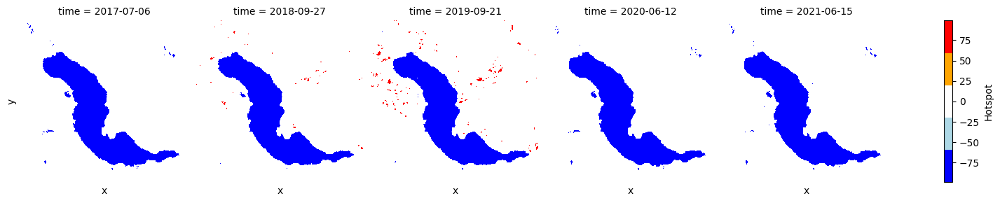

In [19]:
hotspot_colors = {
    -99: "blue",
    -95: "lightblue",
    -90: "white",
    0: "orange",
    90: "red",
}
hotspot_cmap = plt.cm.colors.ListedColormap([hotspot_colors[val] for val in sorted(hotspot_colors.keys())])

hotspots_ndvi.plot.imshow(
    x="x", 
    y="y", 
    col="time", 
    col_wrap=5, 
    cmap=hotspot_cmap, 
    cbar_kwargs={
        "label": "Hotspot",
    }
)

In [20]:
np.unique(hotspots_ndvi)

array([-99, -95, -90,   0,  90,  95], dtype=int8)